<a href="https://colab.research.google.com/github/vischia/pv_data_science_school/blob/master/4_sesgo_inductivo.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Aplicaciones y Tratamiendo de Datos en Tecnología y Física

(C)2025 Pietro Vischia, vischia@uniovi.es

## PL 1: sesgo inductivo

### Plug symmetries in machine learning models

There are three main ways:

- *data augmentation*: replicate each data point by e.g. generating its transformed version under the symmetry in exam. Example to read: [Chen, 2020](https://www.jmlr.org/papers/v21/20-163.html);
- *loss function penalties*: add a penalty term to the cross section (e.g. penalizing models that do not satisfy the required properties. Example to read: [Karpatne, 2017](https://doi.org/10.1109/TKDE.2017.2720168);
- *architectural design*: tweak the architecture of the model to make it satisfy some symmetries. For instance, CNNs for rotations and traslations. Works with approximate and exact symmetries.

In this PL, you will train a dense neural network model and a model where the network output is tweaked to enforce a certain symmetry, as an example of enforcing symmetry by architectural desing.



### Charge and Parity

In particle physics, each fundamental particle is described by a set of properties, the *quantum numbers*, that are linked to their quantomechanical properties. For instance, each particle has an electric charge: the electron has charge -1, the positron (antielectron) has charge +1, and so on.

Some of these quantum numbers are *conserved*, meaning that in any interaction among particles, for a certain quantum number the sum of that number for all the particles involved must remain constant before and after the interaction. For instance, in electron-positron scattering (also called [Bhabha scattering](https://en.wikipedia.org/wiki/Bhabha_scattering)) two quantum numbers are conserved:
- the total electrical charge (0 at the beginning, 0 at the end). It is impossible to obtain two electrons (total charge -2) when making one electron and one positron collide (total charge 0);
- the lepton flavour, i.e. the number of leptons of each type. There are two electron-like objects at the beginning and two electron-like objects at the end. It is not possible to obtain one electron and one muon (1 electron-like, 0 muon-like) when making one electron and one positron collide (2 electron-like).

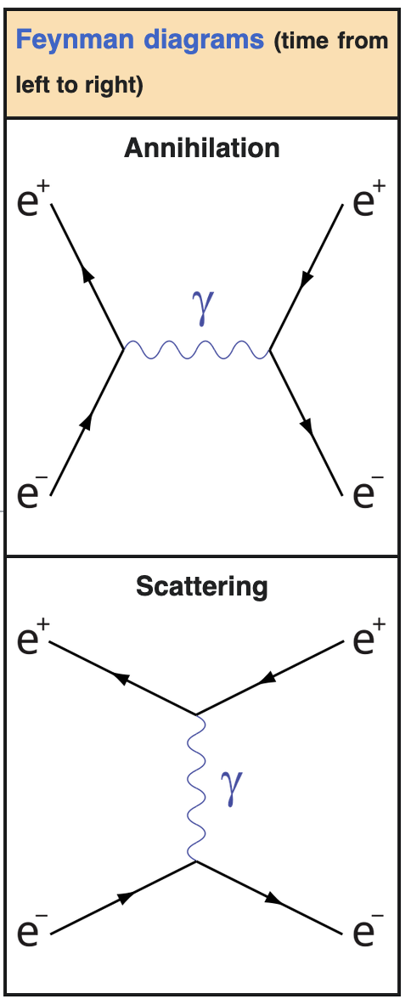
Image from [Wikipedia](https://en.wikipedia.org/wiki/Bhabha_scattering)

In this PL we will consider two symmetries:
- *Charge conjugation*: transform a particle into an antiparticle by changing the sign of its electric charge. The antiparticle of a charge-0 particle is the same particle.
Another symmetry is called *parity*, consisting in 
- *Parity*, also called *space inversion*, consists in a reflection through the origin of the space coordinates of a particle (or particle system). For instance, the space dimensions $x$, $y$, $z$ are transformed into $-x$, $-y$; $-z$. When parity is conserved, left and right, as well as up and down, are indistinguishable.

For a long time we though the combined Charge and Parity (CP) symmetry, defined as "invert space coordinates AND change the sign of the electric charge", was conserved. In the 50s it was observed that e.g. there is no fundamental reason why parity should be conserved. 
In 1972, when all the six quarks had not yet been observed, Kobayashi and Maskawa theorized  that if there are six types of quarks then CP should be violated in the standard model of particle physics. You can read more [in the Encyclopedia Britannica](https://www.britannica.com/science/CP-violation).

At the CMS experiment of CERN, we are trying to identify CP violation in processes like the production of two quarks top, decaying into a final state with two leptons, two b quarks, and two neutrinos. The neutrinos are not detected, so they are visible as momentum imbalance in the transverse plane (called "missing transverse momentum").

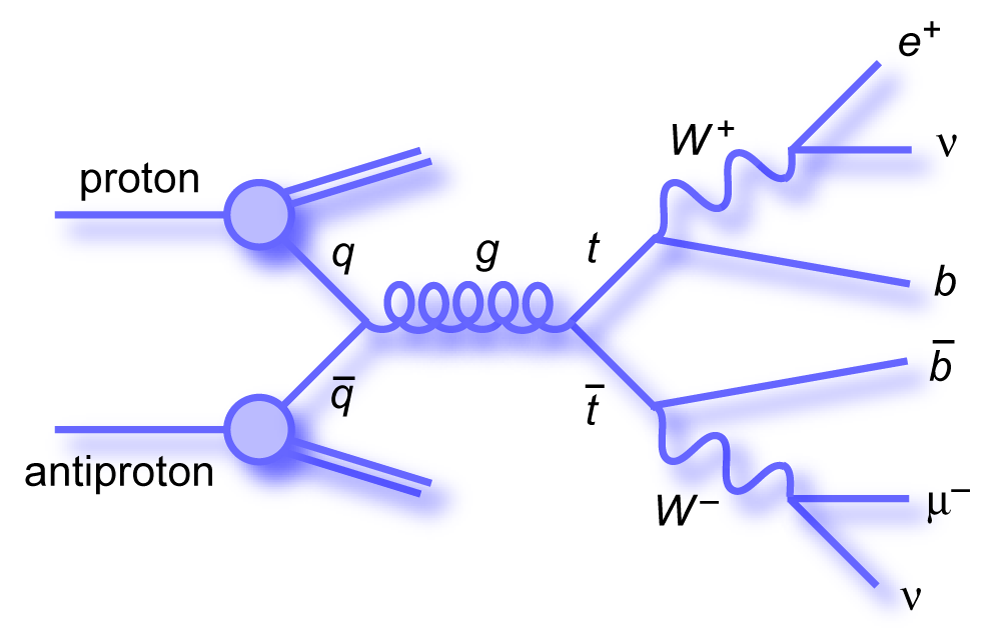
Image from [here](https://cds.cern.ch/record/2299951/plots)




In top quark physics, the probability of interaction between the particles involved may change if there are new physics effect.

In Effective Field Theories (EFT), we assume we can parameterize in a simple way effects due to new physics. Each of these probabilities is determined by an *operator* which corresponds to a *coupling*

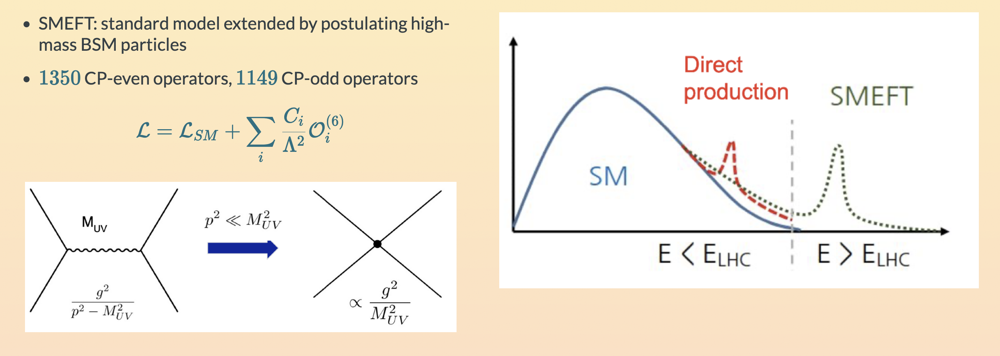

In SMEFT (Standard Model Effective Field Theory), we assume that the interaction probabilities are constituted by three terms:

- Standard Model: describes the probabilities predicted by the standard model
- BSM (Beyond Standard Model): a parameterization of new physics effects
- Quantum interference between SM and BSM: a consequence of quantum mechanics is that two concurrent phenomena that result in the same final state may not just sum up to each other summing the two probabilities, but they also may subtract from each other (interference).

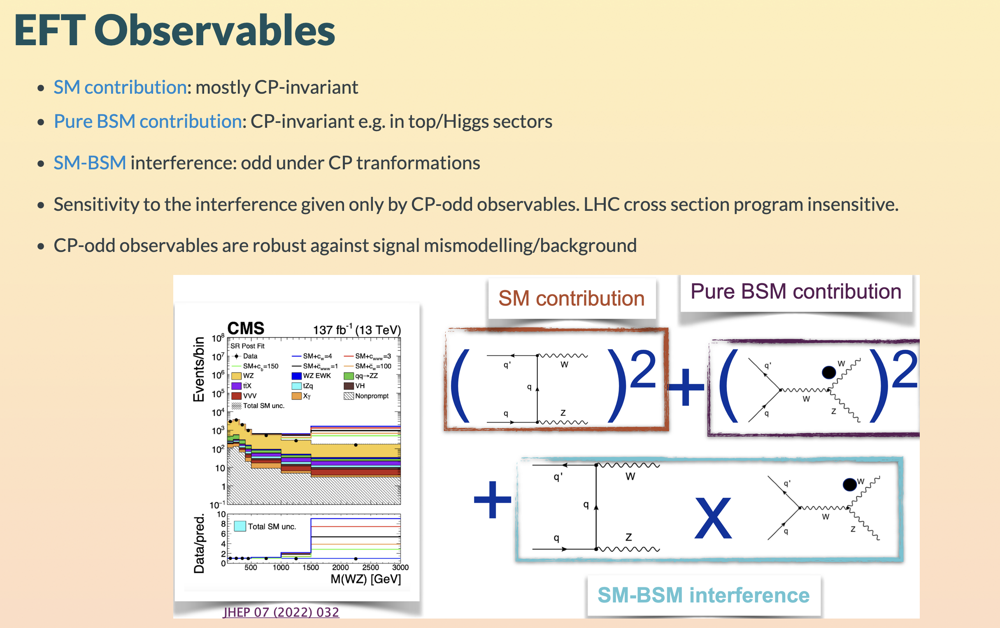

In this notebook, you will load ttbar->llbb events and train neural networks to learn the likelihood ratio between the interference term and the SM term:

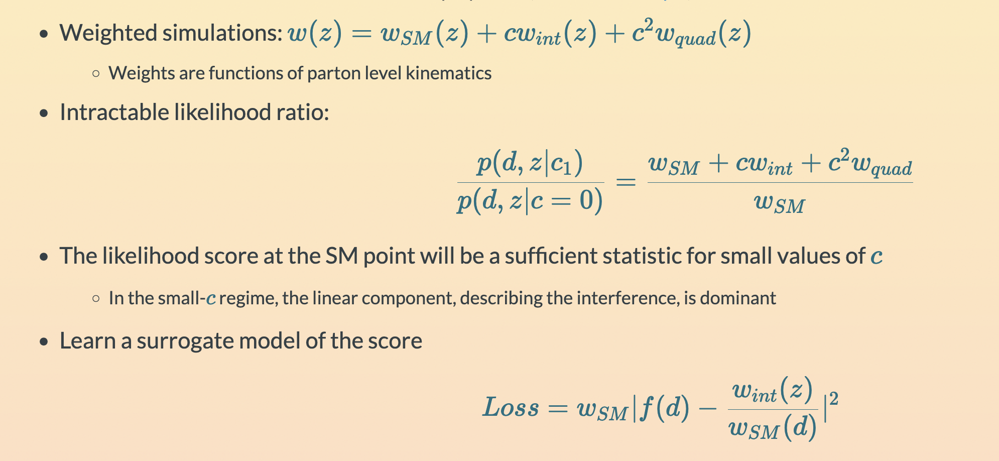

Learning the likelihood ratio is a technique we refer to as SALLY, from [10.1103/PhysRevLett.121.111801](https://journals.aps.org/prl/abstract/10.1103/PhysRevLett.121.111801)
You will first train a regular neural network to regress the likelihood ratio, and then display the loss function.

Then, you will train a physics-informed neural network, where you will force the CP symmetry:

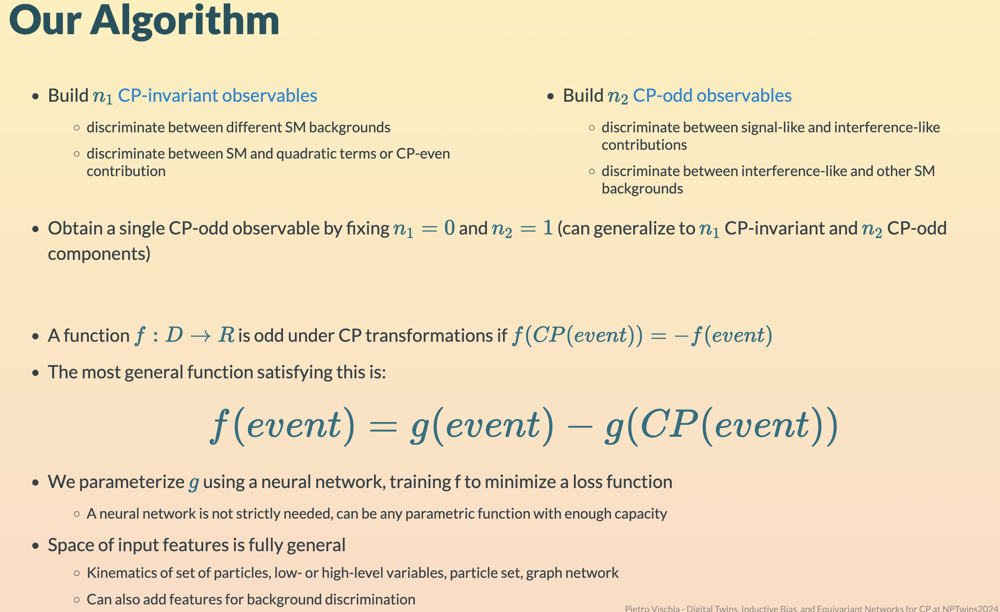

To do so, you will need to define the CP transformation:

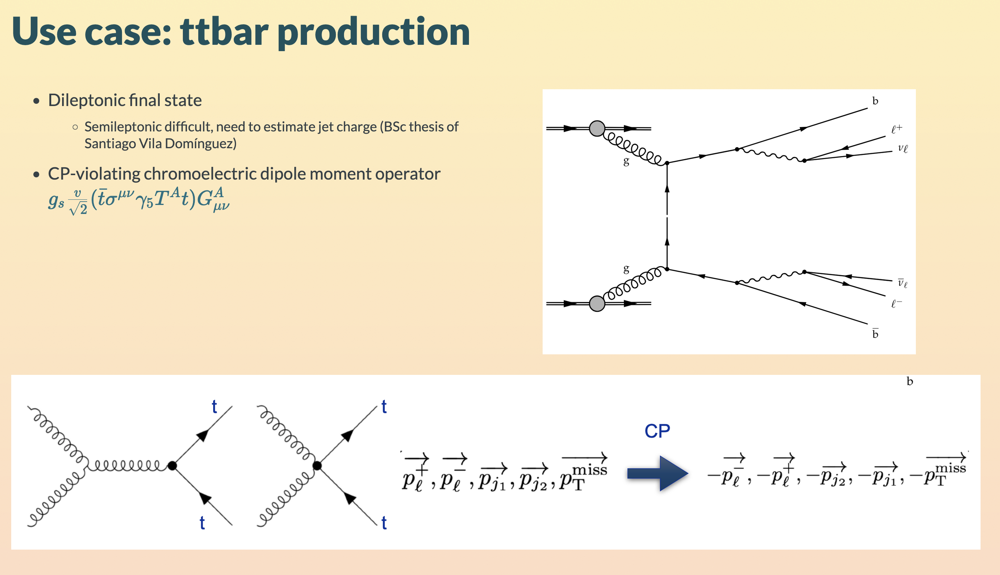

If we call `net` a sequential pytorch model, then the output of the network will have to be `net(x) - net(cpx)`, where `cpx` is the CP-transformed input `x`.



### Objectives:

- train a dense network to regress the weights
- train a CP-equivariant network to regress the weights
- compare the evolution of the loss function for the two networks, and comment on how to interpret the differences (which one is faster to train? Why?)
  
Suggestion: in class, run one training per each network. At home, to prepare the report, run about 100 random replicas of each of the two training cases, and for each case draw the envelope or the average+variance of the trials. Compare the envelope for the dense network and the one for the CP-equivariant network

In [1]:
import torch
import numpy as np 
from tqdm import tqdm
from torch import optim
import os 
import json
import matplotlib.pyplot as plt
from collections import defaultdict 
import os 
import tempfile 
import pdb 

In [2]:
from torch.utils.data import DataLoader

In [3]:
# Get the data

! wget https://www.hep.uniovi.es/vischia/atdtf/practica_1_data.tar.gz
! tar xzvf practica_1_data.tar.gz

--2025-12-15 15:56:14--  https://www.hep.uniovi.es/vischia/atdtf/practica_1_data.tar.gz
Resolviendo www.hep.uniovi.es (www.hep.uniovi.es)... 156.35.212.25
Conectando con www.hep.uniovi.es (www.hep.uniovi.es)[156.35.212.25]:443... conectado.
Petición HTTP enviada, esperando respuesta... 200 OK
Longitud: 995060540 (949M) [application/x-gzip]
Grabando a: «practica_1_data.tar.gz»

practica_1_data.tar 100%[===================>] 948,96M  22,1MB/s    en 49s     

2025-12-15 15:57:04 (19,3 MB/s) - «practica_1_data.tar.gz» guardado [995060540/995060540]

x ttbar_delphes_forTraining_8may/ttbar_delphes_forTraining/
x ttbar_delphes_forTraining_8may/ttbar_delphes_forTraining/tag_2_delphes_events135.h5
x ttbar_delphes_forTraining_8may/ttbar_delphes_forTraining/tag_1_delphes_events240.h5
x ttbar_delphes_forTraining_8may/ttbar_delphes_forTraining/tag_1_delphes_events211.h5
x ttbar_delphes_forTraining_8may/ttbar_delphes_forTraining/tag_1_delphes_events116.h5
x ttbar_delphes_forTraining_8may/ttbar_delph

In [4]:
data_folder = "ttbar_delphes_forTraining_8may/ttbar_delphes_forTraining/"

First build the dataset and then create the data loaders.

The features description is:

Weights:
- `weights_sm`: the SM weight
- `weights_lin`: the linear (interference term) weight
- `weights_quad`: the square term (BSM)

Input features:
- `lp_px`: the $p_x$ of the positive-charge lepton
- `lp_py`: the $p_y$ of the positive-charge lepton
- `lp_pz`: the $p_z$ of the positive-charge lepton
- `lm_px`: the $p_x$ of the negative-charge lepton
- `lm_py`: the $p_y$ of the negative-charge lepton
- `lm_pz`: the $p_z$ of the negative-charge lepton
- `b1_px`: the $p_x$ of one of the two b quarks
- `b1_py`: the $p_y$ of one of the two b quarks
- `b1_pz`: the $p_z$ of one of the two b quarks
- `b2_px`: the $p_x$ of the other b quark
- `b2_py`: the $p_y$ of the other b quark
- `b2_pz`: the $p_z$ of the other b quark
- `met_px`: the $x$ component of the missing transferse momentum (an estimate of the transverse momentum of the sum of the neutrinos)
- `met_py`: the $y$ component of the missing transferse momentum (an estimate of the transverse momentum of the sum of the neutrinos)

The basic neural network will have to be a dense model that takes the input features and learns the likelihood ratio calculated from the weights.

The likelihood ratio will be defined from the weights as `weight_lin / weight_sm`. The dataset and data loader defined below will put the weights into an array `[weight_sm, weight_lin, weight_quad`. I therefore suggest to use as loss function:

`torch.mean(weight[:,0]*(score[:,0]-(weight[:,1]/weight[:,0]))**2)`

In [5]:
from torch.utils.data import Dataset, IterableDataset
import torch.nn as nn
import glob
import tables
import pandas as pd

class dataset( IterableDataset ):
    def __init__( self, path, device):
        self.files=glob.glob(path)
        self.device=device
        self.length=0
        for fil in self.files:
            h5file=tables.open_file(fil, mode='r')
            self.length+=h5file.root.df.axis1.shape[0]
            h5file.close()

    def __len__(self):
        return self.length

    def __iter__(self):
        for f in self.files:
            thedata=pd.read_hdf(f, 'df')
            # For debugging of the column names, e.g., print(thedata.columns)
            weights  =torch.Tensor(thedata[["weight_sm", "weight_lin_ctGI",
                                             "weight_quad_ctGI"]].values).to(self.device)
            variables=torch.Tensor(thedata[['lep_pos_px', 'lep_pos_py', 'lep_pos_pz',
                                             'lep_neg_px', 'lep_neg_py', 'lep_neg_pz',
                                             'random_b1_px', 'random_b1_py', 'random_b1_pz',
                                             'random_b2_px', 'random_b2_py', 'random_b2_pz',
                                             'met_px', 'met_py']].values).to(self.device)
            yield from zip(weights, variables)


class network(nn.Module):
    def __init__(self, device):
        super().__init__()
        self.main_module = nn.Sequential( 
            nn.Linear(14,80),
            nn.LeakyReLU(),
            nn.Linear(80, 80),
            nn.LeakyReLU(),
            nn.Linear(80, 40),
            nn.LeakyReLU(),
            nn.Linear(40, 20),
            nn.LeakyReLU(),
            nn.Linear(20, 1 ),
        )
        self.main_module.to(device)

    def forward(self, x):

        return self.main_module(x)
 
# Set properly the torch device, in case you want to use GPU etc
device = "gpu"



ModuleNotFoundError: No module named 'tables'

In [ ]:
print("Loading training ")
training =dataset( f'{data_folder}/*.h5', device=device)
print("Loading test ")
test     =dataset( f'{data_folder}/test/*.h5', device=device)

In [ ]:
batch_size= 64
dataloader = DataLoader( training, batch_size=batch_size) 
test_loader  = DataLoader(test, batch_size=1000)

In [ ]:
next(iter(dataloader))

In [6]:
# Training and test loops

def train_loop(dataloader, model, loss_fn, optimizer, scheduler, best_model_path, device, disable=False):
    size = len(dataloader.dataset)
    losses=[] # Track the loss function
    # Set the model to training mode - important for batch normalization and dropout layers
    # Unnecessary in this situation but added for best practices
    model.train()
    #for batch, (X, y) in enumerate(dataloader):
    best_loss = np.inf
    for weight, input_vars in tqdm(dataloader, disable=disable):
        # Reset gradients (to avoid their accumulation)
        optimizer.zero_grad()
        # Compute prediction and loss
        score = model(X)
        #if (all_equal3(pred.detach().numpy())):
        #    print("All equal!")
        loss = loss_fn(weight, score)
        losses.append(loss.detach().cpu())
        if loss < best_loss:
            best_loss = loss.detach().cpu()
            torch.save(model.state_dict(), best_model_path) # Save the full state of the model, to have access to the training history
        # Backpropagation
        loss.backward()
        optimizer.step()

    scheduler.step()
    return np.mean(losses)

def test_loop(dataloader, model, loss_fn, device, disable=False):
    losses=[] # Track the loss function
    # Set the model to evaluation mode - important for batch normalization and dropout layers
    # Unnecessary in this situation but added for best practices
    model.eval()
    size = len(dataloader.dataset)
    num_batches = len(dataloader)
    test_loss, correct = 0, 0

    # Evaluating the model with torch.no_grad() ensures that no gradients are computed during test mode
    # also serves to reduce unnecessary gradient computations and memory usage for tensors with requires_grad=True
    with torch.no_grad():
        #for X, y in dataloader:
        for weight, input_vars in tqdm(dataloader, disable=disable):
            score = model(input_vars)
            loss = loss_fn(weight, score)
            losses.append(loss)
            test_loss += loss
            #correct += (pred.argmax(1) == y).type(torch.float).sum().item()
            
    return np.mean(losses)


In [ ]:
epochs = 5
# Instantiate the model
net=network(device)

# Define optimizer, scheduler, loss function 

initialLearningRate = 0.001 # tweaking this leads to dramatic changes in the learning algorithm
# The optimizer decides which path to follow through the gradient of the loss function
optimizer = torch.optim.Adam(net.parameters(),initialLearningRate)

# The scheduler reduces the learning rate for the optimizer in order to for the optimizer to be able to "enter" narrow minima
scheduler = torch.optim.lr_scheduler.ExponentialLR(optimizer, gamma=0.9)

# For standard cases, the most common Loss functions are already coded for you:
# loss_fn = torch.nn.BCELoss() # If using the sigmoid. Otherwise, no sigmoid but: BCEWithLogitsLoss(pos_weight=pos_weight.to(device)) (used to increase class importance for instance)
# Here we need a custom one to define the likelihood ratio
def loss_func( weight, score, control):
    return torch.mean(weight[:,0]*(score[:,0]-(weight[:,1]/weight[:,0]))**2)


In [ ]:
train_losses=[]
test_losses=[]
best_model_path = "best_dnn_model.h5"
for t in range(epochs):
    if t%5 == 0:
        print(f"Epoch {t+1}\n-------------------------------")
    train_loss=train_loop(dataloader, net, loss_fn, optimizer, scheduler, best_model_path, device, disable=True)
    test_loss=test_loop(test_loader, net, loss_fn, device, disable=True)
    train_losses.append(train_loss)
    test_losses.append(test_loss)
    if t%5 == 0:
        print("Avg train loss", train_loss, ", Avg test loss", test_loss, "Current learning rate", scheduler.get_last_lr())
print("Done!")

In [ ]:
# Now redo everything but the network is cp-equivariant


class eqnetwork(nn.Module):
    def __init__(self, device):
        super().__init__()
        self.main_module = nn.Sequential( 
            nn.Linear(14,80),
            nn.LeakyReLU(),
            nn.Linear(80, 80),
            nn.LeakyReLU(),
            nn.Linear(80, 40),
            nn.LeakyReLU(),
            nn.Linear(40, 20),
            nn.LeakyReLU(),
            nn.Linear(20, 1 ),        )
        self.main_module.to(device)

    def forward(self, x):
        # Here you have, given x, to calculate cpx. Refer to the diagrams above for which input feature to swap and invert.
        
        return # Here you will have to return "the most generic CP-equivariant function", referring to the slide above "Our Algorithm"


In [ ]:
# Now visualize the evolution of the two loss functions (regular network, and equivariant).
# Also visualize the learned score in both cases and whether they differ.
# Comment on difference (or lack thereof) in the score and in the loss evolution.
